In [28]:
import os
import nibabel as nib
import nilearn
import numpy as np
import pandas as pd
from nilearn import plotting, image, datasets, regions, maskers
from nilearn.connectome import ConnectivityMeasure
from tqdm import tqdm_notebook
import multiprocessing as mp
print(mp.cpu_count())
# import csv
import warnings
warnings.filterwarnings("ignore") #ignore warnings

16


In [37]:
#base directory
base_dir = '..'
data_dir = os.path.join(base_dir, 'shared/ds000030_R1.0.5/uncompressed/derivatives/fmriprep')
tasks = ['bart', 'scap', 'bht', 'stopsignal']

In [21]:
#get roi atals
# Dictionaries of Functional Modes ("DiFuMo") atlas
dim = 128
res = 2
difumo = datasets.fetch_atlas_difumo(
    dimension=dim, resolution_mm=res, legacy_format=False
)

In [68]:
def run_batch(num_processes, mylist = os.listdir(data_dir)[21:]):
    p = mp.Pool(processes = num_processes)
    num_batches = int(np.ceil(len(mylist)/num_processes))
    for i in tqdm_notebook(range(num_batches)):
        p.map(process_sub_fc, mylist[i*num_processes:min(len(mylist), (i+1)*num_processes)])

In [ ]:
num_processes = 6
run_batch(num_processes)

  0%|          | 0/20 [00:00<?, ?it/s]

loading data for sub-10361 of bartloading data for sub-10975 of bartloading data for sub-10912 of bartloading data for sub-10376 of bartloading data for sub-11019 of bartloading data for sub-11088 of bart







In [64]:
def process_sub_fc(sub_dir):
    """
    this function processes fc data for each subject across all tasks
    takes: sub data directory
    returns: pairwise connectivity data
    """
    sub_df = pd.DataFrame()
    #print(f"current process: {mp.current_process().name}")
    #loop over each task
    for task_type in tasks:
        roi_ts = get_roi_time_series(sub_dir, task_type)
        df = get_pairwise_connectivity(roi_ts, task_type, sub_dir=sub_dir)
        sub_df = pd.concat([sub_df, df], ignore_index=True)
    
    #append subID and save that subject's data to a csv file
    sub_df['sub'] = int(sub_dir.split('-')[-1])
    sub_df.to_csv('processed_data/'+sub_dir+'.csv')

In [65]:
#loop over each file dir
# for sub_dir in tqdm_notebook(os.listdir(data_dir)[9:30]):
#     sub_df = pd.DataFrame()
#     for task_type in tasks:
#         roi_ts = get_roi_time_series(sub_dir, task_type)
#         df = get_pairwise_connectivity(roi_ts, task_type)
#         # df['task'] = task_type
#         sub_df = pd.concat([sub_df, df], ignore_index=True)
#     sub_df['sub'] = int(sub_dir.split('-')[-1])
#     sub_df.to_csv('processed_data/'+sub_dir+'.csv')
    

In [66]:
def get_pairwise_connectivity(roi_time_series, 
                              task_type,
                              sub_dir, 
                              labels = difumo.labels.difumo_names):
    """
    this file generats pairwise connectivity data for given roi time series data
    takes: roi time series data, labeled task type, sub_dir for printing
    returns: dataframe of pairwise connectivity
    """
    
    print(f"calculating connectivity matrix for {sub_dir} of {task_type}")
    #get connectivity matrix based on timeseries data
    correlation_measure = ConnectivityMeasure(kind='correlation')
    correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]
    
    #convert to pairewise df
    df = pd.DataFrame(correlation_matrix)
    df = df.unstack().to_frame().reset_index()
    df[['level_0', 'level_1']] = df[['level_0', 'level_1']].replace(range(len(difumo.labels.difumo_names)), 
                                                                difumo.labels.difumo_names)
    df = df.rename({0: 'correlation'}, axis=1)
    df['task'] = task_type
    
    return df

In [67]:
def get_roi_time_series(sub_dir,
                        task_type,
                        data_dir = data_dir,
                        template = difumo, 
                        confound_list = ['WhiteMatter','GlobalSignal','X','Y','Z','RotX','RotY','RotZ']):
    
    """
    this file extracts roi time series given the roi atalas and functional data
    takes: subject data directory, task type
    returns: dataframe of pairwise connectivity
    """
    
    print(f"loading data for {sub_dir} of {task_type}")
    #get directory for image data
    sub_fname = sub_dir + '_task-' + task_type + '_bold_space-MNI152NLin2009cAsym_preproc.nii.gz'
    sub_file_dir = os.path.join(data_dir, sub_dir, 'func', sub_fname)
    #load functional image
    sub_img = nib.load(sub_file_dir)
    
    #get directory for confounds
    confound_name = sub_dir + '_task-' + task_type + '_bold_confounds.tsv'
    confound_path = os.path.join(data_dir, sub_dir, 'func', confound_name)
    confound_df = pd.read_csv(confound_path, sep='\t')
    confound_sel = confound_df[confound_list]
    #get maskers based on template atlas
    masker = maskers.NiftiMapsMasker(
        template.maps, resampling_target="data",
        t_r=2, detrend=True,
        low_pass=0.1, high_pass=0.01).fit()
    
    print(f"extracting roi for {sub_dir} of {task_type}")
    #fit image to masker to get roi timeseries
    roi_time_series = masker.transform(sub_img, confounds=confound_sel)
    
    return roi_time_series

# OLD Visualization

In [ ]:
#example subject
subID = 10159
sub_dir = 'sub-' + str(subID)
#get the task that this subject is performing
taskType = 'bart'
#get example file directory
fname = sub_dir + '_task-' + taskType + '_bold.nii.gz'
#get image
#sub_img = nib.load(os.path.join(data_dir, sub_dir, 'func', fname))
sub_img = nib.load('sub-10304_task-scap_bold_space-MNI152NLin2009cAsym_preproc.nii.gz')
np.shape(sub_img)

In [86]:
icbm_template = datasets.fetch_icbm152_2009()
mni_template = datasets.load_mni152_template(resolution = 2)
yeo = datasets.fetch_atlas_yeo_2011()

/srv/conda/envs/notebook/lib/python3.10/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



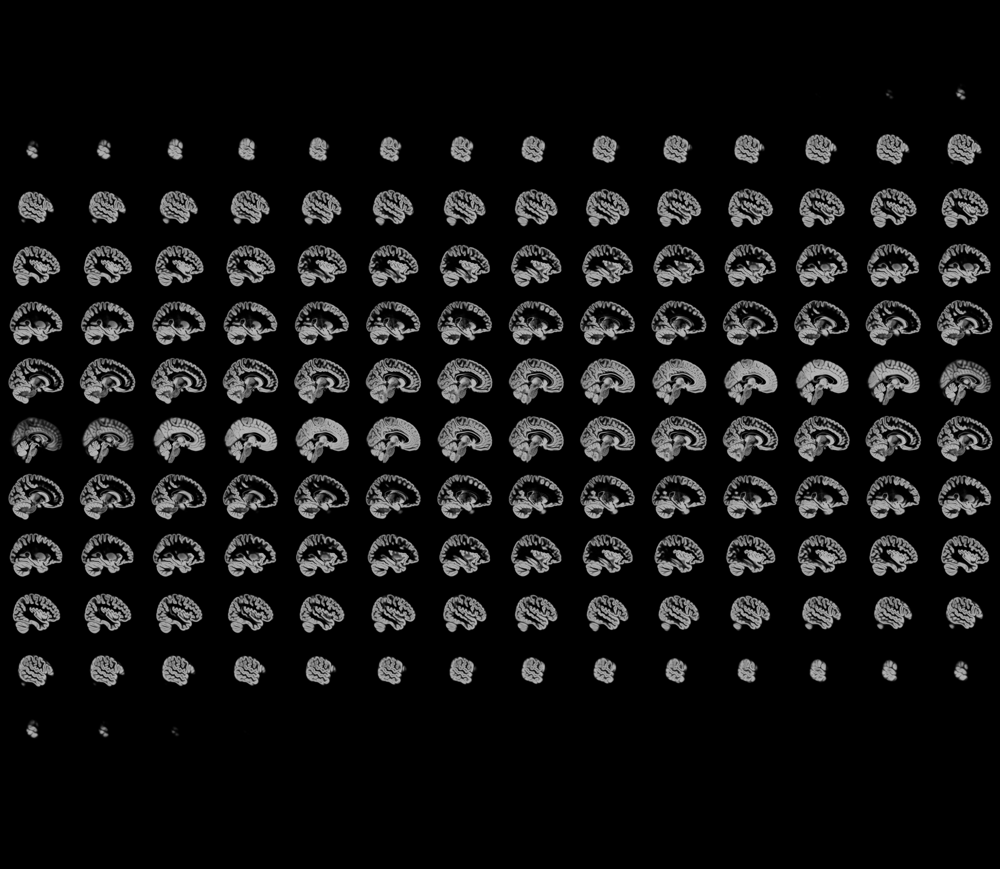
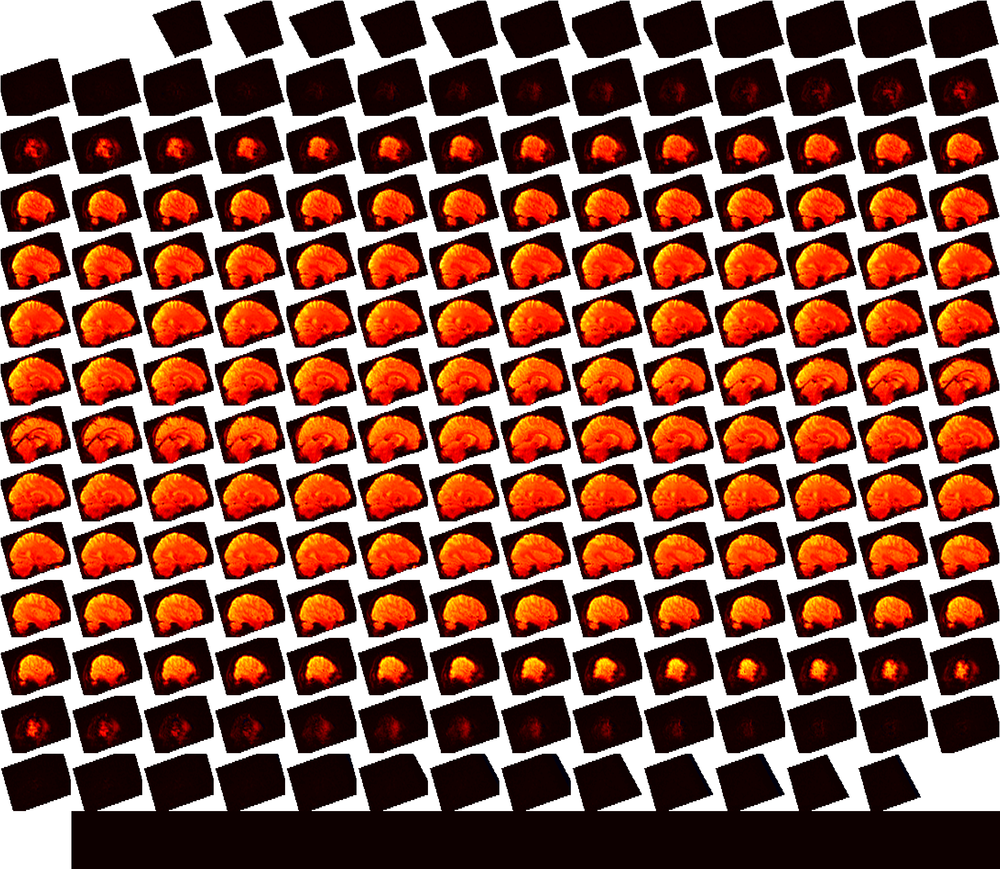

In [84]:
plotting.view_img(image.index_img(sub_img, 1), bg_img=icbm_template['gm'], opacity=0.5)

/srv/conda/envs/notebook/lib/python3.10/site-packages/nilearn/regions/region_extractor.py:603: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  new_labels_img = new_img_like(labels_img, new_labels_data, affine=affine)


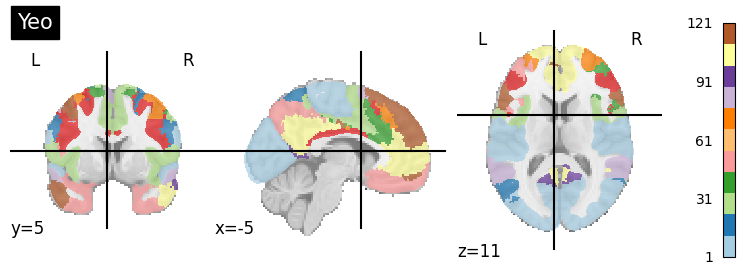

In [106]:
from nilearn.regions import connected_label_regions
region_labels = connected_label_regions(yeo['thick_17'])

plotting.plot_roi(region_labels, title='Yeo',
                  colorbar=True, cmap='Paired')

In [101]:
#apply a masker
msdl_atlas = datasets.fetch_atlas_msdl()
masker = maskers.NiftiMapsMasker(
    msdl_atlas.maps, resampling_target="data",
    t_r=2, detrend=True,
    low_pass=0.1, high_pass=0.01).fit()

In [104]:
roi_time_series = masker.transform(sub_img)
roi_time_series.shape

(291, 39)

In [105]:
#connectivity
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]

/srv/conda/envs/notebook/lib/python3.10/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


In [113]:
correlation_matrix

array([[0.        , 0.801048  , 0.4365698 , ..., 0.4001178 , 0.30288307,
        0.25720637],
       [0.801048  , 0.        , 0.54374987, ..., 0.51065282, 0.45664708,
        0.42578195],
       [0.4365698 , 0.54374987, 0.        , ..., 0.56669113, 0.3142454 ,
        0.33327026],
       ...,
       [0.4001178 , 0.51065282, 0.56669113, ..., 0.        , 0.61939266,
        0.65736503],
       [0.30288307, 0.45664708, 0.3142454 , ..., 0.61939266, 0.        ,
        0.91140458],
       [0.25720637, 0.42578195, 0.33327026, ..., 0.65736503, 0.91140458,
        0.        ]])

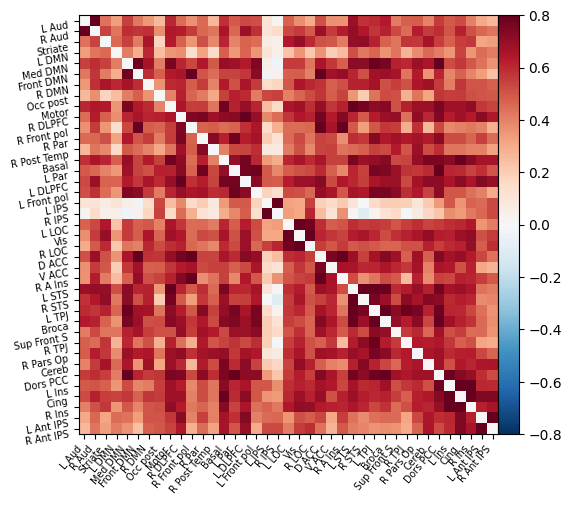

In [119]:
np.fill_diagonal(correlation_matrix, 0)
plotting.plot_matrix(correlation_matrix, labels=msdl_atlas.labels,
                     vmax=0.8, vmin=-0.8, colorbar=True)

In [109]:
plotting.view_connectome(correlation_matrix, edge_threshold=0.2,
                         node_coords=msdl_atlas.region_coords)